In [321]:
# Clear all variables
%reset -f

In [322]:
from s04utils.modules.load import timestamps
from s04utils.modules.analyze import levels, preprocessing
from bokeh.plotting import figure, show, output_notebook, curdoc
from IPython.core.display import set_matplotlib_formats
from bokeh.models import LinearAxis, Range1d
from matplotlib import pyplot as plt
import numpy as np
from scipy import signal
from bokeh.models import HoverTool
import seaborn as sns
from skimage.filters import threshold_otsu, threshold_mean
import math
from sklearn.mixture import GaussianMixture
from scipy import stats

In [323]:
# Set the path to the data
timestamps_path_01 = '/Users/kappel/Messungen/Setup04/JaKa/post_hack/23_08_09/77K-33nM-eGFP-vitrified/10uW/timestamps/tt_eGFP_33nm_NaP_100mM_ph7dot5_Treh7dot5_10uW_77K_circpol_013.h5'
timestamps_path_02 = '/Users/kappel/Messungen/Setup04/JaKa/post_hack/23_08_07/77K-16nM-eGFP-vitrified/10uW/timestamps/tt_eGFP_16dot5nm_NaP_100mM_ph7dot5_Treh7dot5_10uW_77K_circpol_012.h5'

In [324]:
# Load timestamps from file

# Timestamps file 01
ts_01 = timestamps.load_from_path(path=timestamps_path_01)

# Timestamps file 02
ts_02 = timestamps.load_from_path(path=timestamps_path_02)



In [325]:
# Set output style for plt plots
#plt.style.use('dark_background')
#plt.style.use('fivethirtyeight')
#plt.style.use('ggplot')
#plt.style.use('seaborn-v0_8')
#plt.style.use('white-grid')

# Set quality for plt plots
set_matplotlib_formats('retina')

# Set output style for bokeh plots
#curdoc().theme = 'dark_minimal'
output_notebook()

/var/folders/2h/6xcys3mx1s7czfj28g_dc70r0000gn/T/ipykernel_31439/1772914816.py:9: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('retina')


Loading BokehJS ...

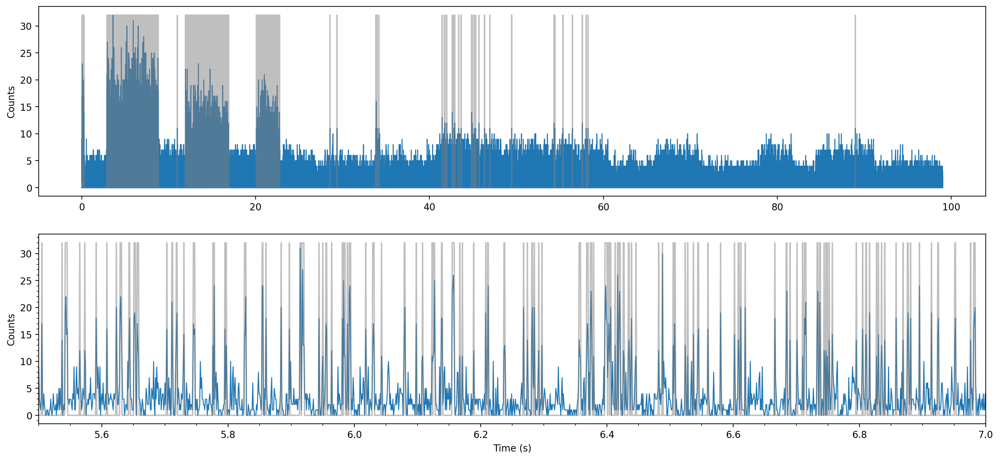

[9 5 2 ... 1 3 3]


In [326]:
# Set bin time to 1 ms
bin_time = 0.001

# Create binned timetrace
timetrace01 = ts_01.get_timetrace_data(bin_width=bin_time)

# Get the binned timetrace data for each individual detector
detector0 = timetrace01['detector0'][0]
detector1 = timetrace01['detector1'][0]

# Perform thresholding on the timetrace of detector 0
threshold = 10
thresh_detector0 = [np.max(detector0) if x > threshold else 0 for x in detector0]

# Create figure with two subplots
fig, ax =   plt.subplots(2, 1, figsize=(18,8))
# Add minor ticks
plt.minorticks_on()

# Create values for x-axis
x = np.arange(0, len(detector0))

# First subplot
y0 = ts_01.get_timetrace_data(bin_width=bin_time)['detector0'][0]
line1 = ax[0].plot(x*bin_time, y0)
ax[0].plot(x*bin_time, thresh_detector0, alpha=0.5, color='gray')

# Second subplot
y1 = ts_01.get_timetrace_data(bin_width=bin_time)['detector0'][0]
line2 = ax[1].plot(x*bin_time, y1)
ax[1].plot(x*bin_time, thresh_detector0, alpha=0.5, color='gray')

# Use polyfit to fit a polynomial to the data
#polyfit = np.polyfit(range(len(detector0)), detector0, 2)

# Plot the polynomial
#plt.plot(np.polyval(polyfit, range(len(detector0))))

# Substract polynomial from data
#detector0_poly = detector0 - np.polyval(polyfit, range(len(detector0)))

# Plot the substraction
#plt.plot(detector0_poly)

# Add axis labels
ax[0].set_ylabel('Counts')
ax[1].set_ylabel('Counts')
ax[1].set_xlabel('Time (s)')

# Set axis limits
ax[1].set_xlim(5.5, 7)

# Set line width
line1[0].set_linewidth(1)
line2[0].set_linewidth(1)

# Show the plot
plt.show()

print(detector0)
# Save detector0 to a text file
np.savetxt('detector0.txt', detector0, fmt='%d')

In [327]:
timestamps0 = detector0
timetrace_len = timestamps0[-1]
timetrace_len_in_s = 5e-9 * timetrace_len
x = np.linspace(0, timetrace_len_in_s, len(detector0))


p = figure(width=1600, height=400, title='steps')

p.line(x, detector0, line_color='#517BA1', line_width=1)
p.line(x, thresh_detector0, line_color='red', alpha=0.2 , line_width=1)

# Fill area under the curve
p.varea(x=x, y1=thresh_detector0, y2=0, fill_color='red', alpha=0.2)

# Plot the threshold as a horizontal line
p.line(x, np.ones(len(x)) * threshold, line_color='green', alpha=0.4 , line_width=2)

# Add a HoverTool to display cursor information
hover = HoverTool(tooltips=[('x', '$x'), ('y', '$y')])
p.add_tools(hover)

# Set the axis labels
p.xaxis.axis_label = 'time (s)'
p.yaxis.axis_label = 'counts per ' + str(int(bin_time*1e3)) + ' ms'

# Show the plot
show(p)

Otsu threshold: 3
Maxima of the component distributions: [1.76819361 7.85221414]
Maximum of the on population: 2


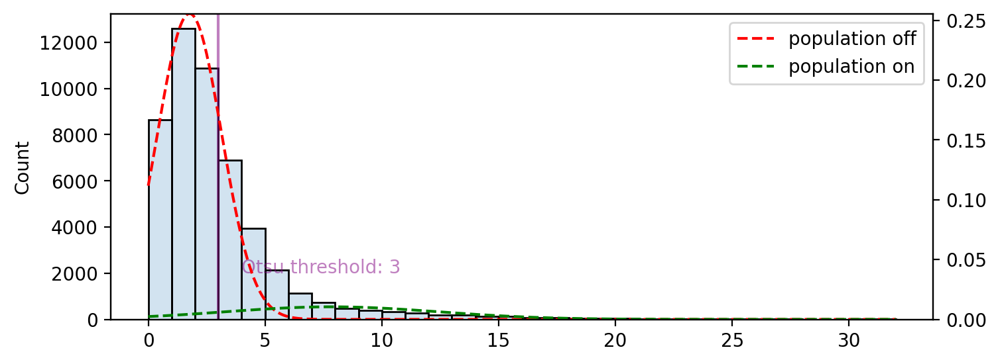

In [328]:
detector0_len = len(detector0)
detector0_half = detector0[:int(detector0_len/2)]

# Create histogram ov values in timetrace
hist, bin_edges = np.histogram(detector0_half, bins=np.max(detector0))

# Create figure for seaborn histplot
fig, ax1 = plt.subplots(figsize=(8,3))
sns.histplot(detector0_half, bins=np.max(detector0), ax=ax1, alpha=0.2)

# Calculate Otsu's threshold
threshold_otsu = threshold_otsu(detector0)

# Plot the thresholds as a vertical lines
plt.axvline(threshold_otsu, color='purple', alpha=0.5)

# Plot the values of the thresholds as text
plt.text(threshold_otsu+1, 2000, 'Otsu threshold: ' + str(threshold_otsu), rotation=0, color='purple', alpha=0.5)

print('Otsu threshold: ' + str(threshold_otsu))


# Create a second y-axis on the right side
ax2 = ax1.twinx()

# Fit a mixture model to the histogram
gmm = GaussianMixture(n_components=2)
gmm.fit(detector0_half.reshape(-1, 1))

# Get the means and standard deviations of the component distributions
means = gmm.means_.flatten()
stds = np.sqrt(gmm.covariances_).flatten()

# Plot the component distributions as normal curves
x = np.linspace(0, np.max(detector0), 1000)
y1 = gmm.weights_[0] * stats.norm.pdf(x, means[0], stds[0])
y2 = gmm.weights_[1] * stats.norm.pdf(x, means[1], stds[1])

ax2.plot(x, y1, 'r--', label='population off')
ax2.plot(x, y2, 'g--', label='population on')
ax2.margins(y=0)

# Print x values of the maxima of the component distributions
print('Maxima of the component distributions: ' + str(means))
print('Maximum of the on population: ' + str(round(means[0])))

# Pick the higher value as the threshold
if means[0] > means[1]:
    threshold_on = round(means[0])
else:
    threshold_on = round(means[1])


# Add max values of the component distributions as vertical lines
#ax2.axvline(means[0], color='red', alpha=0.5)
#ax2.axvline(means[1], color='green', alpha=0.5)

plt.legend()
plt.show()



In [329]:
def hyst(x, th_lo, th_hi, initial = False):
    hi = x > th_hi
    lo_or_hi = (x < th_lo) | hi
    ind = np.nonzero(lo_or_hi)[0]
    if not ind.size: # prevent index error if ind is empty
        return np.zeros_like(x, dtype=bool) | initial
    cnt = np.cumsum(lo_or_hi) # from 0 to len(ind)
    return np.where(cnt, hi[ind[cnt-1]], initial)

timestamps0 = ts_01.data['detector0'].to_numpy()
timetrace_len = timestamps0[-1]
timetrace_len_in_s = 5e-9 * timetrace_len



steps = timetrace_len_in_s/bin_time
print('Number of steps: ' + str(steps))

# Get digits of bin_time
bin_time_digits = len(str(bin_time).split('.')[1])

# Round timetrace_len_in_s to same number of digits as bin_time
timetrace_len_in_s = round(timetrace_len_in_s, bin_time_digits) - 2*bin_time

x = np.linspace(0, timetrace_len_in_s, len(detector0))
print('Tiemtrace len in s: ' + str(timetrace_len_in_s) + ' s')

print('Timevalue of last datapoint: ' + str(x[-1]) + ' ms')

print('Difference between two datapoints: '+ str(x[1] - x[0]))
print('Timevalue of first datapoint: ' + str(x[0]) + ' ms')
print('Timevalue of second datapoint: ' + str(x[1]) + ' ms')

print('Total timetrace length: ' + str(timetrace_len_in_s) + ' s')
print('Time trace length with bintime resolution: ' + str(bin_time * len(detector0)) + ' s')
print('Total number of datapoints in counts: ' + str(len(detector0)))
print('Total number of datapoints in bins: ' + str(len(x)))
print('Step size: ' + str((timetrace_len_in_s-2*bin_time) / len(detector0)) + ' s')



# Set the thresholds
th_lo = threshold_otsu
th_hi = threshold_on

# Calculate hysteresis
hyst_detector0 = hyst(detector0, th_lo=th_lo, th_hi=th_hi, initial=True)

# Replace True with 1 and False with 0
hyst_detector0 = hyst_detector0.astype(int)

p = figure(width=1600, height=400, title='steps')

# Setting the second y axis range name and range
p.extra_y_ranges = {"on_off": Range1d(start=0, end=1)}
p.y_range = Range1d(0, np.max(detector0)+10)
#p.extra_y_ranges["on_off"] = Range1d(start=0, end=1)

# Adding the second axis to the plot.  
p.add_layout(LinearAxis(y_range_name="on_off"), 'right')

signal = p.line(x, detector0, line_color='#517BA1', line_width=1)
#p.line(x, hyst_detector0, line_color='red', alpha=0.2 , line_width=1, y_range_name="on_off")
p.varea(x=x, y1=hyst_detector0, y2=0, fill_color='red', alpha=0.2, y_range_name="on_off")

# Fill area under the curve
#p.varea(x=x, y1=thresh_detector0, y2=0, fill_color='red', alpha=0.2)

# Plot the thresholds as a horizontal lines
p.line(x, np.ones(len(x)) * th_hi, line_color='green', alpha=0.4 , line_width=2)
p.line(x, np.ones(len(x)) * th_lo, line_color='red', alpha=0.4 , line_width=2)

# Add a HoverTool to display cursor information
hover = HoverTool(tooltips=[('x', '$x'), ('y', '$y')], mode='mouse', point_policy='snap_to_data', renderers=[signal])
p.add_tools(hover)
p.margin = 0

# Set the axis labels
p.xaxis.axis_label = 'time (s)'
p.yaxis.axis_label = 'counts per ' + str(int(bin_time*1e3)) + ' ms'

# Show the plot
show(p)

# Print a preview of x in a nice way
def pprint(x):
    print('[' + ', '.join(['{:.6f}'.format(i) for i in x]) + ']')
pprint(x)

Number of steps: 99020.24721
Tiemtrace len in s: 99.018 s
Timevalue of last datapoint: 99.018 ms
Difference between two datapoints: 0.0009999899009281046
Timevalue of first datapoint: 0.0 ms
Timevalue of second datapoint: 0.0009999899009281046 ms
Total timetrace length: 99.018 s
Time trace length with bintime resolution: 99.02 s
Total number of datapoints in counts: 99020
Total number of datapoints in bins: 99020
Step size: 0.0009999596041203797 s


[0.000000, 0.001000, 0.002000, 0.003000, 0.004000, 0.005000, 0.006000, 0.007000, 0.008000, 0.009000, 0.010000, 0.011000, 0.012000, 0.013000, 0.014000, 0.015000, 0.016000, 0.017000, 0.018000, 0.019000, 0.020000, 0.021000, 0.022000, 0.023000, 0.024000, 0.025000, 0.026000, 0.027000, 0.028000, 0.029000, 0.030000, 0.031000, 0.032000, 0.033000, 0.034000, 0.035000, 0.036000, 0.037000, 0.038000, 0.039000, 0.040000, 0.041000, 0.042000, 0.043000, 0.044000, 0.045000, 0.046000, 0.047000, 0.048000, 0.049000, 0.049999, 0.050999, 0.051999, 0.052999, 0.053999, 0.054999, 0.055999, 0.056999, 0.057999, 0.058999, 0.059999, 0.060999, 0.061999, 0.062999, 0.063999, 0.064999, 0.065999, 0.066999, 0.067999, 0.068999, 0.069999, 0.070999, 0.071999, 0.072999, 0.073999, 0.074999, 0.075999, 0.076999, 0.077999, 0.078999, 0.079999, 0.080999, 0.081999, 0.082999, 0.083999, 0.084999, 0.085999, 0.086999, 0.087999, 0.088999, 0.089999, 0.090999, 0.091999, 0.092999, 0.093999, 0.094999, 0.095999, 0.096999, 0.097999, 0.098999,

In [330]:
intervals_on = []
start = None

for i, v in enumerate(hyst_detector0):
    if v == 1 and start is None:
        start = i
    elif v == 0 and start is not None:
        intervals_on.append(i - start)
        start = None

if start is not None:
    intervals_on.append(len(hyst_detector0) - start)

print(intervals_on)

[2, 2, 3, 2, 9, 3, 3, 4, 2, 7, 5, 2, 3, 1, 4, 1, 1, 1, 4, 3, 1, 2, 3, 5, 3, 3, 1, 3, 2, 4, 10, 1, 1, 1, 4, 5, 2, 9, 6, 3, 10, 4, 2, 4, 1, 2, 2, 2, 1, 1, 1, 2, 2, 3, 2, 3, 1, 2, 2, 5, 6, 3, 1, 3, 1, 3, 1, 1, 2, 1, 8, 2, 3, 4, 2, 2, 1, 2, 4, 4, 4, 3, 11, 1, 2, 2, 3, 1, 4, 1, 2, 2, 3, 3, 4, 1, 1, 6, 1, 2, 4, 4, 3, 8, 2, 7, 1, 1, 2, 2, 3, 1, 7, 3, 1, 7, 3, 6, 3, 2, 3, 4, 10, 5, 1, 2, 1, 2, 3, 1, 1, 5, 2, 2, 5, 2, 2, 5, 2, 5, 2, 5, 1, 6, 2, 2, 2, 6, 4, 4, 1, 2, 4, 1, 5, 7, 1, 6, 5, 2, 10, 4, 2, 2, 4, 1, 1, 2, 2, 1, 1, 3, 1, 2, 2, 3, 2, 1, 5, 3, 2, 2, 3, 2, 3, 5, 5, 2, 1, 2, 2, 2, 1, 1, 1, 3, 3, 7, 2, 4, 4, 3, 2, 1, 1, 2, 4, 2, 1, 2, 1, 3, 1, 4, 3, 2, 2, 2, 3, 1, 2, 3, 4, 2, 6, 2, 6, 3, 6, 2, 5, 10, 3, 1, 5, 3, 2, 2, 1, 6, 1, 8, 2, 5, 1, 3, 2, 7, 7, 4, 5, 1, 3, 1, 2, 3, 2, 3, 5, 1, 4, 4, 1, 1, 3, 2, 2, 2, 4, 2, 7, 2, 2, 3, 1, 1, 1, 3, 2, 3, 2, 2, 1, 3, 2, 2, 3, 1, 3, 6, 1, 2, 1, 4, 1, 3, 1, 2, 2, 2, 1, 3, 1, 2, 6, 1, 1, 2, 4, 3, 3, 1, 1, 10, 1, 1, 1, 3, 2, 3, 3, 2, 3, 7, 4, 2, 1, 1, 1, 2, 2,

In [331]:
intervals_off = []
start = None

for i, v in enumerate(hyst_detector0):
    if v == 0 and start is None:
        start = i
    elif v == 1 and start is not None:
        intervals_off.append(i - start)
        start = None

if start is not None:
    intervals_off.append(len(hyst_detector0) - start)

print(intervals_off)

[9, 21, 24, 9, 8, 16, 3, 5, 9, 3, 1, 1, 7, 27, 17, 5, 26, 6, 1, 265, 2371, 4, 3, 2, 5, 9, 8, 3, 8, 14, 8, 16, 27, 1, 2, 6, 4, 14, 8, 2, 1, 11, 6, 39, 18, 5, 3, 18, 1, 1, 6, 2, 7, 1, 7, 4, 18, 18, 17, 10, 7, 9, 16, 2, 12, 6, 5, 2, 2, 13, 14, 15, 4, 3, 13, 2, 9, 15, 3, 7, 9, 7, 14, 1, 3, 6, 4, 20, 10, 9, 8, 5, 5, 4, 3, 8, 10, 7, 4, 2, 5, 8, 5, 9, 5, 11, 14, 3, 1, 3, 6, 8, 3, 18, 14, 2, 2, 10, 6, 2, 3, 4, 4, 2, 1, 8, 19, 6, 11, 14, 4, 13, 2, 8, 2, 6, 9, 8, 5, 12, 4, 7, 4, 4, 10, 2, 6, 4, 4, 17, 9, 17, 19, 16, 7, 5, 20, 9, 39, 16, 36, 1, 12, 17, 7, 3, 6, 20, 9, 8, 6, 1, 25, 1, 3, 24, 7, 6, 7, 3, 16, 3, 4, 40, 6, 3, 17, 3, 20, 28, 15, 6, 5, 3, 4, 47, 8, 15, 11, 8, 11, 13, 14, 11, 1, 3, 3, 16, 12, 17, 10, 12, 7, 4, 58, 4, 16, 1, 9, 2, 14, 2, 6, 31, 16, 14, 1, 6, 8, 12, 9, 4, 6, 2, 9, 1, 3, 30, 4, 8, 3, 5, 16, 1, 10, 12, 4, 5, 3, 1, 21, 4, 13, 7, 4, 9, 14, 8, 15, 1, 13, 5, 3, 17, 25, 4, 22, 11, 13, 1, 20, 3, 3, 7, 9, 6, 1, 3, 1, 14, 7, 2, 6, 11, 9, 23, 16, 8, 13, 6, 2, 3, 11, 8, 3, 3, 11, 17,

Text(0, 0.5, 'counts')

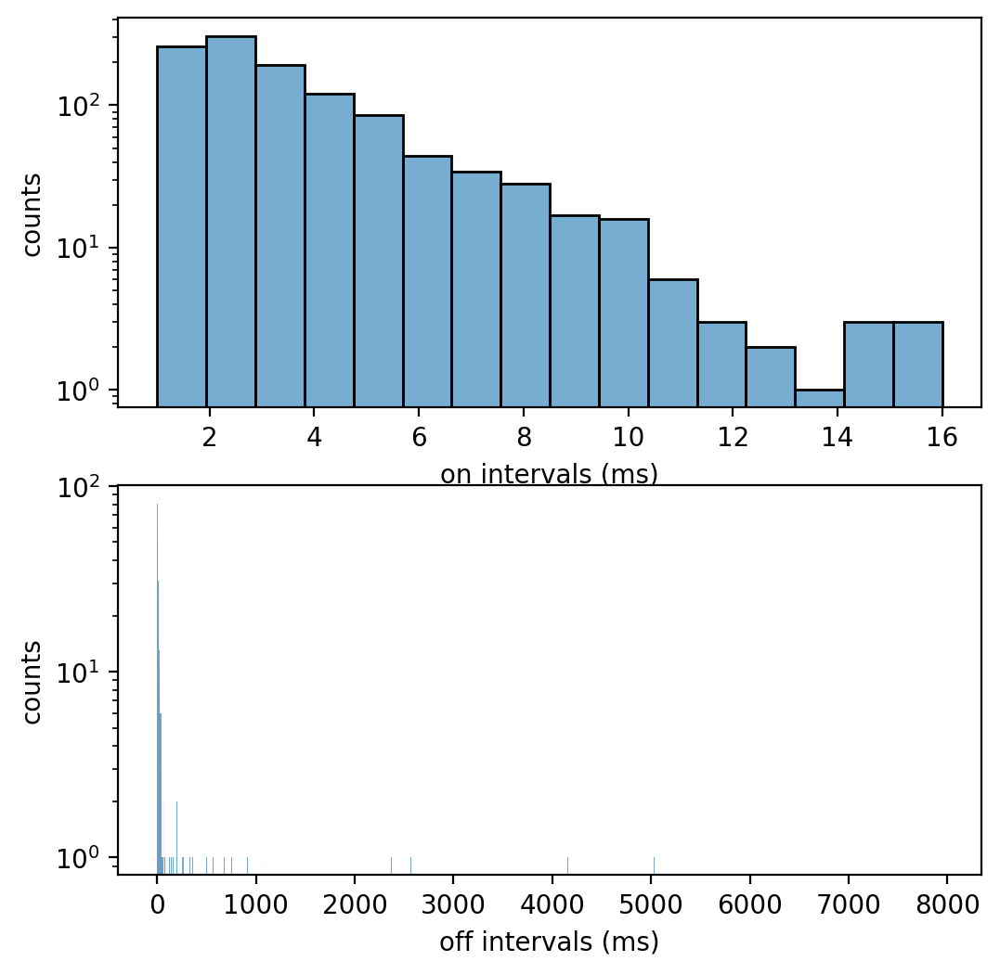

In [332]:
# delete last off time from intervals_off
del intervals_off[-1]

# Create a figure for two subplots 
fig, ax = plt.subplots(2, 1, figsize=(6,6))

# seaborn histplot of the on intervals
sns.histplot(intervals_on, bins=np.max(intervals_on), ax=ax[0], alpha=0.6)
ax[0].set_yscale('log')

# Set axis labels
ax[0].set_xlabel('on intervals (ms)')
ax[0].set_ylabel('counts')

# seaborn histplot of the off intervals
sns.histplot(intervals_off, bins=np.max(intervals_off), ax=ax[1], alpha=0.6)
ax[1].set_yscale('log')

# Set axis labels
ax[1].set_xlabel('off intervals (ms)')
ax[1].set_ylabel('counts')
